In [59]:
#%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
from torch.optim.lr_scheduler import StepLR


seed = random.randint(1, 10000) # random seed
print("Random Seed: ", seed)
random.seed(seed)
torch.manual_seed(seed)

Random Seed:  385


In [60]:
# Root directory for dataset
dataroot = "~/datasets/anime-faces"

# Number of workers for dataloader
workers = 2

# Batch size during training
batch_size = 128

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 64

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 10

# Starting Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparameter for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

# used for computing the Wasserstein Loss
lambda_ = 25

43102


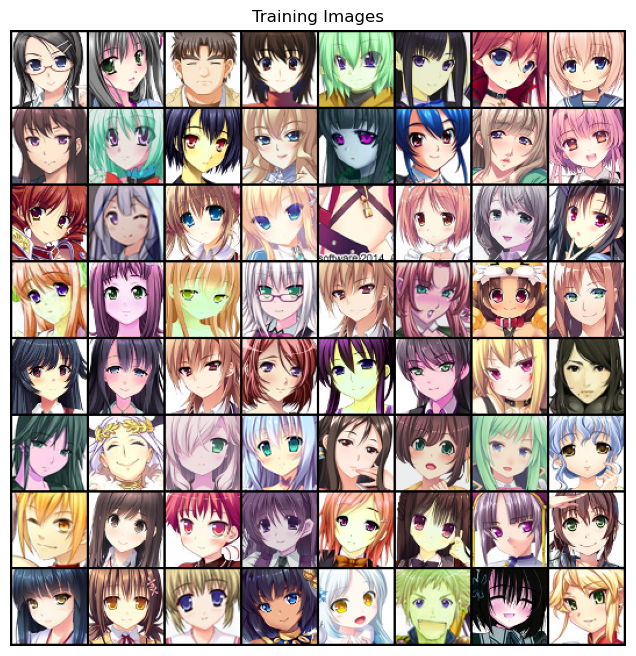

In [61]:
# We can use an image folder dataset the way we have it setup.
# Create the dataset
original_dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))
augmented_dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               # adding some data augmentation
                               transforms.RandomHorizontalFlip(),
                               transforms.ColorJitter(contrast=0.2, saturation=0.2, hue=0.2),
                               #
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))
dataset = torch.utils.data.ConcatDataset([original_dataset, augmented_dataset])
print(len(dataset))

# Create the dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))
plt.show()

In [62]:
# custom weights initialization called on ``netG`` and ``netD``
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [63]:
# Generator Code

class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.LeakyReLU(0.2),
            # state size. ``(ngf*8) x 4 x 4``
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.LeakyReLU(0.2),
            # state size. ``(ngf*4) x 8 x 8``
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.LeakyReLU(0.2),
            # state size. ``(ngf*2) x 16 x 16``
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.LeakyReLU(0.2),
            # state size. ``(ngf) x 32 x 32``
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. ``(nc) x 64 x 64``
        )

    def forward(self, input):
        return self.main(input)

In [64]:
# Create the generator
netG = Generator(ngpu).to(device)

# Handle multi-GPU if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the ``weights_init`` function to randomly initialize all weights
#  to ``mean=0``, ``stdev=0.02``.
netG.apply(weights_init)

# Print the model
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): LeakyReLU(negative_slope=0.2)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): LeakyReLU(negative_slope=0.2)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): LeakyReLU(negative_slope=0.2)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding

In [65]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is ``(nc) x 64 x 64``
            nn.Conv2d(3, 64, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf) x 32 x 32``
            nn.Conv2d(64, 128, 4, 2, 1, bias=False),
            nn.InstanceNorm2d(128, affine=True),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*2) x 16 x 16``
            nn.Conv2d(128, 256, 4, 2, 1, bias=False),
            nn.InstanceNorm2d(256, affine=True),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*4) x 8 x 8``
            nn.Conv2d(256, 512, 4, 2, 1, bias=False),
            nn.InstanceNorm2d(512, affine=True),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*8) x 4 x 4``
            nn.Conv2d(512, 1, 4, 1, 0, bias=False),
        )
        

    def forward(self, input):
        return self.main(input)

In [66]:
def clip_weights(model, clip_value):
    for param in model.parameters():
        param.data.clamp_(-clip_value, clip_value)

In [67]:
# Create the Discriminator
netD = Discriminator(ngpu).to(device)

#Handle multi-GPU if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the ``weights_init`` function to randomly initialize all weights
# like this: ``to mean=0, stdev=0.2``.
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): InstanceNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): InstanceNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
  )
)


In [68]:

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.99))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.99))

In [69]:
# function for printing current learning rate
def get_lr(optimizer):
    for param_group in optimizer.param_groups:
        return param_group['lr']

In [70]:
def gradient_penalty(batch_size, real_images, fake_images):
    # each image in the set gets a random number (between 0 and 1) and is stored in alpha
    alpha = torch.randn(batch_size, 1, 1, 1, device=device)
    alpha = (alpha + 1) / (2 * 1.5)
    # calculating interpolated images
    interpolated = real_images + alpha * (fake_images - real_images)

    interpolated = interpolated.requires_grad_(True)  # Enable gradient calculation
    pred = netD(interpolated).mean()
    # calculating gradient for interpolated images
    grad_output = torch.autograd.grad(outputs=pred, inputs=interpolated,
                                      create_graph=True, only_inputs=True,
                                      retain_graph=True)[0]
    grad_output = grad_output.view(grad_output.shape[0], -1)
    grad_norm = grad_output.norm(2, dim=1)
    gradient_penalty = (grad_norm - 1).abs() ** 2
    # final result
    gp = gradient_penalty.mean()
    return gp

In [71]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

# labels
one = torch.tensor(1, dtype=torch.float) 
mone = one * -1

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):
        # resetting the gradients
        optimizerD.zero_grad()
        # getting real images
        real_images = data[0].to(device)
        # batch size
        b_size = real_images.size(0)
        # generating latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)

        # generating fake images
        fake_images = netG(noise)

        # pass through the real data
        real_predictions = torch.mean(netD(real_images))
        real_predictions.backward(mone)
        # pass through the fake images           
        fake_predictions = torch.mean(netD(fake_images))
        fake_predictions.backward(one)
            

        # calculating gradient penalty
        d_gp = gradient_penalty(b_size, real_images, fake_images)
        # calculating Wasserstein loss
        d_wass_loss =  fake_predictions - real_predictions
        d_loss = d_wass_loss + d_gp * lambda_
   
        optimizerD.step()    
        
        # training generator every 5 iterations
        if i % 3 == 0:
            optimizerG.zero_grad()
            # training the generator
            # generating latent vectors
            noise = torch.randn(b_size, nz, 1, 1, device=device)
            # generating fake images
            fake_images = netG(noise)
            # pass through the fake images
            gen_fake_predictions = netD(fake_images)
            # calculating loss for the generator
            g_loss = -torch.mean(gen_fake_predictions)
        
            g_loss.backward()
            optimizerG.step()
            
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f'
                % (epoch, num_epochs, i, len(dataloader),
                    d_loss.item(), g_loss.item()))

        # Save Losses for plotting later
        G_losses.append(g_loss.item())
        D_losses.append(d_loss.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
        iters += 1
        

Starting Training Loop...
[0/10][0/337]	Loss_D: 22.3680	Loss_G: 1.9489
[0/10][50/337]	Loss_D: -250.6860	Loss_G: 131.6891
[0/10][100/337]	Loss_D: -371.3578	Loss_G: 196.7776
[0/10][150/337]	Loss_D: -485.3763	Loss_G: 254.3608
[0/10][200/337]	Loss_D: -597.0820	Loss_G: 309.1625
[0/10][250/337]	Loss_D: -716.3317	Loss_G: 368.8847
[0/10][300/337]	Loss_D: -838.5731	Loss_G: 430.2362
[1/10][0/337]	Loss_D: -928.9748	Loss_G: 475.8770
[1/10][50/337]	Loss_D: -1056.4308	Loss_G: 536.7305
[1/10][100/337]	Loss_D: -1188.0265	Loss_G: 603.2373
[1/10][150/337]	Loss_D: -1319.4230	Loss_G: 671.9800
[1/10][200/337]	Loss_D: -1453.0054	Loss_G: 738.6378
[1/10][250/337]	Loss_D: -1601.4644	Loss_G: 811.3214
[1/10][300/337]	Loss_D: -1714.8203	Loss_G: 886.1213
[2/10][0/337]	Loss_D: -1847.7847	Loss_G: 941.6221
[2/10][50/337]	Loss_D: -2011.4227	Loss_G: 1015.4762
[2/10][100/337]	Loss_D: -2171.0254	Loss_G: 1095.9756
[2/10][150/337]	Loss_D: -2336.6833	Loss_G: 1179.1082
[2/10][200/337]	Loss_D: -2463.5559	Loss_G: 1259.4739
[2/

KeyboardInterrupt: 

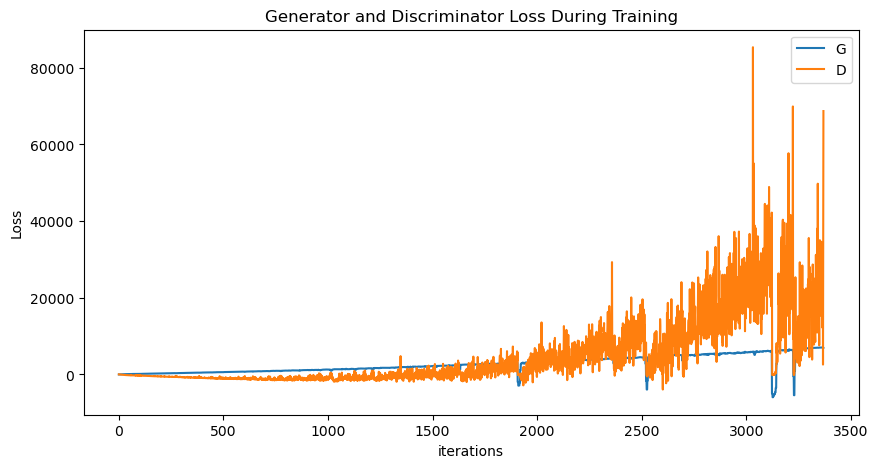

In [ ]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

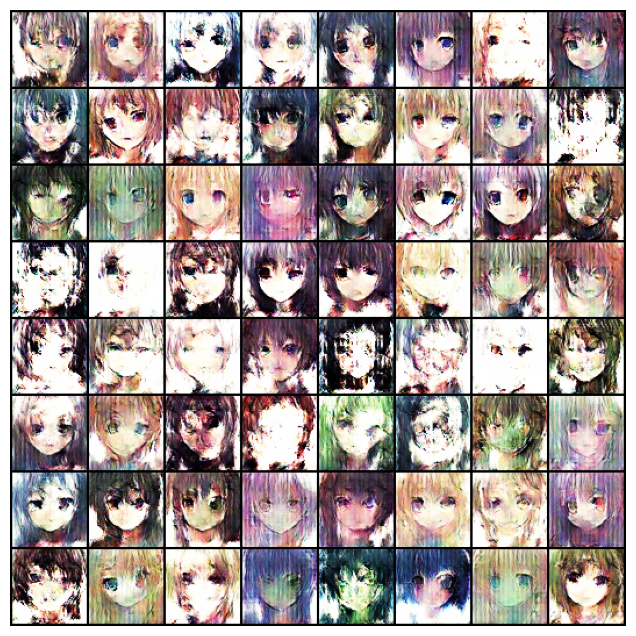

In [ ]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())